In [1]:
%matplotlib inline

from qlearner import *
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import keras

def disable_axis_labels():
    ax = plt.gca()
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])

Using TensorFlow backend.


In [3]:
EXP_COUNT = 1000
experiences = Experience.load_many(EXP_COUNT)

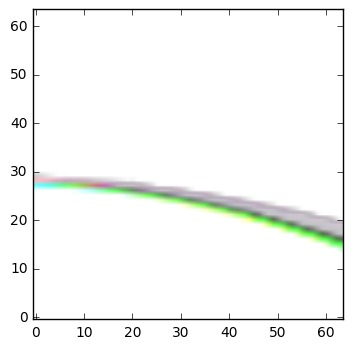

In [4]:
plt.imshow(experiences[90].to_state.data.squeeze(), origin='lower', cmap='gray')

In [2]:
model = keras.models.load_model('actionValue.model')

In [75]:
x = np.stack(exp.from_state.data for exp in experiences)
predictions = model.predict(x)

In [76]:
for pred in predictions:
    print(pred)

[ 19.48074341  20.57912254  18.09502602]
[ 19.45213509  20.53802109  18.0742588 ]
[ 19.4966526   20.57795906  18.10846519]
[ 19.47688293  20.56417465  18.09265709]
[ 19.38222885  20.49778366  18.02272797]
[ 19.25121498  20.39652252  17.92966843]
[ 19.32691956  20.43482208  17.97827911]
[ 19.35437584  20.44829178  17.99500847]
[ 19.59275627  20.67234802  18.14892578]
[ 19.85632133  20.80682564  18.32902527]
[ 20.02837944  20.97415924  18.44965935]
[ 20.23692894  21.27269745  18.63460922]
[ 20.356987    21.48831558  18.7474575 ]
[ 20.52112579  21.72484398  18.87528419]
[ 20.80571938  22.00928879  19.0762558 ]
[ 20.92089272  22.12885666  19.17617607]
[ 21.12796783  22.36910248  19.33913994]
[ 21.56351471  22.55396461  19.64055252]
[ 21.93583298  22.56811333  19.84740448]
[ 22.16584015  22.47460175  19.91637802]
[ 22.60250092  22.58281898  20.11789322]
[ 23.12201309  22.81517601  20.38749695]
[ 22.92298508  22.65908051  20.2501564 ]
[ 22.73680878  21.7442112   19.79225922]
[ 22.78612137  2

In [77]:
def softmax(x):
    scoreMatExp = np.exp(x)
    return scoreMatExp / scoreMatExp.sum(0)

def manipulate(img, sm_pred):
    rgb_img = np.stack([img, img, img], axis=2)
    width = img.shape[1]
    width_l, width_f, width_r = (width * sm_pred).astype(int)
    rgb_img[:, :width_l, 1:] = 0
    rgb_img[:, width_l:width_l+width_f, ::2] = 0
    rgb_img[:, width_l+width_f:, :2] = 0
    return rgb_img

def draw_decisions():
    fig = plt.figure(1, (EXP_COUNT // 5, 20))
    grid = ImageGrid(fig, 111, nrows_ncols=(EXP_COUNT // 10, 10), axes_pad=0)
    
    for i, experience in enumerate(experiences):
        img = experience.from_state.data.squeeze()
        pred = predictions[i]
        sm_pred = softmax(pred - np.max(pred))
        grid[i].imshow(manipulate(img, sm_pred), origin='lower')
        
def save_decisions():
    for i, experience in enumerate(experiences):
        img = experience.from_state.data[:, :, -1].squeeze()
        pred = predictions[i]
        sm_pred = softmax(pred - np.max(pred))
        plt.imsave('decisions/d{}.png'.format(i), manipulate(img, sm_pred), origin='lower')
        
save_decisions()

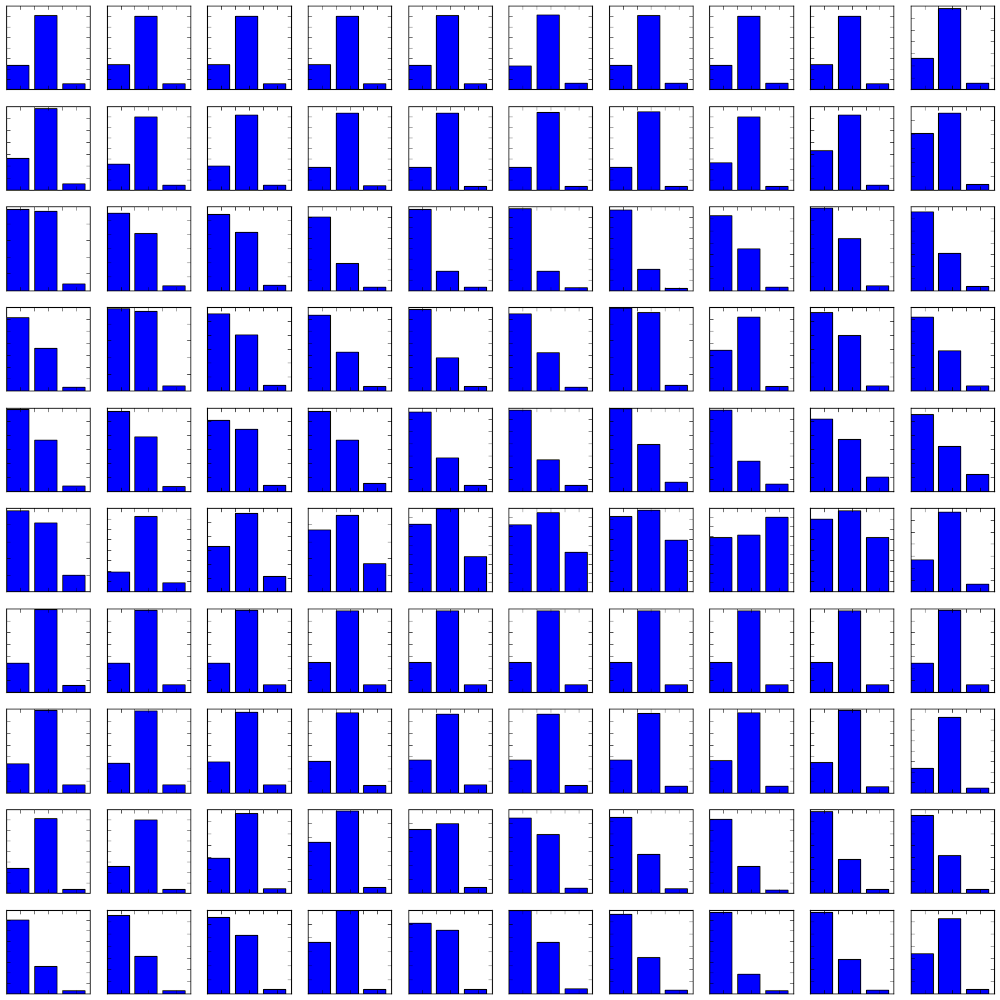

In [78]:
def draw_decision_bars(count):
    plt.figure(1, (20, 20))

    for i, pred in enumerate(predictions[:count]):
        plt.subplot(count // 10, 10, i + 1)
        disable_axis_labels()
        rel = softmax(pred - np.max(pred))
        plt.bar(np.arange(3), rel)

    plt.show()
draw_decision_bars(100)

In [79]:
sum(1 for e in experiences if e.to_state.is_terminal)

17

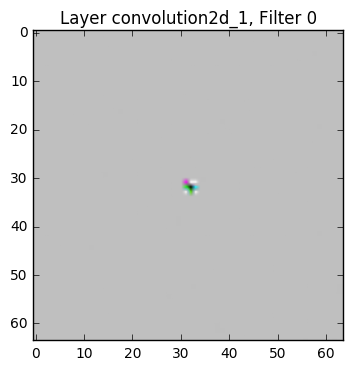

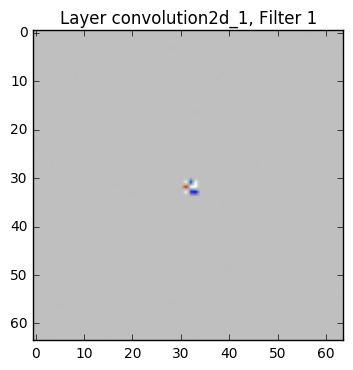

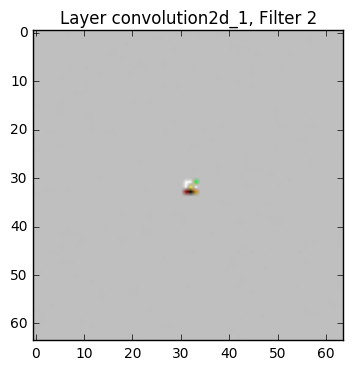

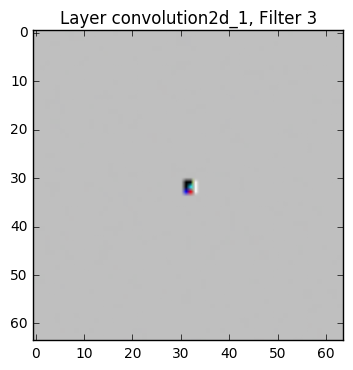

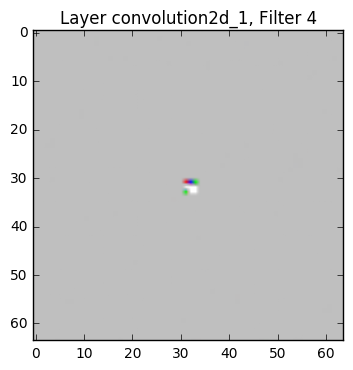

...

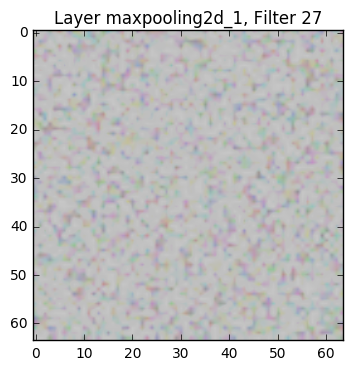

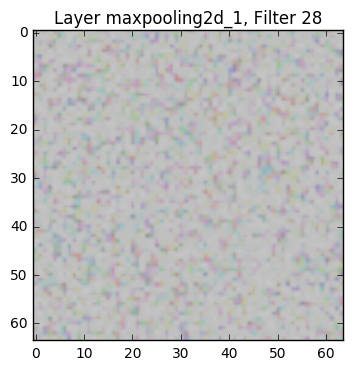

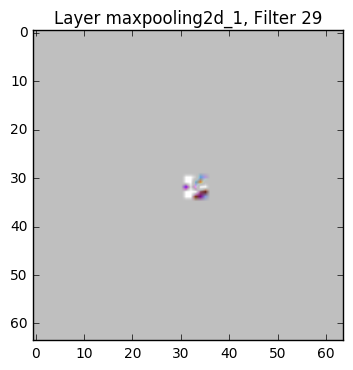

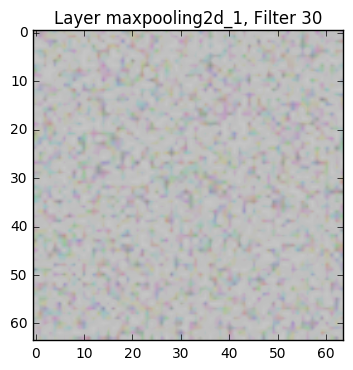

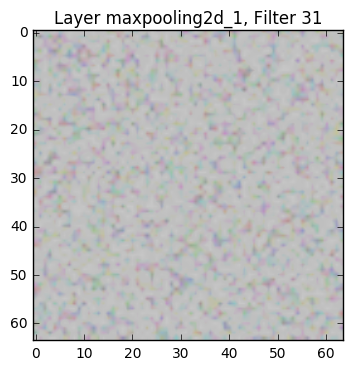

InvalidArgumentError: You must feed a value for placeholder tensor 'keras_learning_phase' with dtype bool
	 [[Node: keras_learning_phase = Placeholder[dtype=DT_BOOL, shape=[], _device="/job:localhost/replica:0/task:0/cpu:0"]()]]

Caused by op 'keras_learning_phase', defined at:
  File "/usr/local/Cellar/python3/3.5.2_3/Frameworks/Python.framework/Versions/3.5/lib/python3.5/runpy.py", line 184, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/local/Cellar/python3/3.5.2_3/Frameworks/Python.framework/Versions/3.5/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.5/site-packages/ipykernel/__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/usr/local/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 474, in start
    ioloop.IOLoop.instance().start()
  File "/usr/local/lib/python3.5/site-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/usr/local/lib/python3.5/site-packages/tornado/ioloop.py", line 866, in start
    handler_func(fd_obj, events)
  File "/usr/local/lib/python3.5/site-packages/tornado/stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.5/site-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/usr/local/lib/python3.5/site-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/usr/local/lib/python3.5/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/usr/local/lib/python3.5/site-packages/tornado/stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.5/site-packages/ipykernel/kernelbase.py", line 276, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/usr/local/lib/python3.5/site-packages/ipykernel/kernelbase.py", line 228, in dispatch_shell
    handler(stream, idents, msg)
  File "/usr/local/lib/python3.5/site-packages/ipykernel/kernelbase.py", line 390, in execute_request
    user_expressions, allow_stdin)
  File "/usr/local/lib/python3.5/site-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/usr/local/lib/python3.5/site-packages/ipykernel/zmqshell.py", line 501, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/usr/local/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2717, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/usr/local/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2821, in run_ast_nodes
    if self.run_code(code, result):
  File "/usr/local/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-2-1c1a13463f2d>", line 1, in <module>
    model = keras.models.load_model('actionValue.model')
  File "/usr/local/lib/python3.5/site-packages/keras/models.py", line 140, in load_model
    model = model_from_config(model_config, custom_objects=custom_objects)
  File "/usr/local/lib/python3.5/site-packages/keras/models.py", line 190, in model_from_config
    return layer_from_config(config, custom_objects=custom_objects)
  File "/usr/local/lib/python3.5/site-packages/keras/utils/layer_utils.py", line 40, in layer_from_config
    return layer_class.from_config(config['config'])
  File "/usr/local/lib/python3.5/site-packages/keras/models.py", line 1080, in from_config
    model.add(layer)
  File "/usr/local/lib/python3.5/site-packages/keras/models.py", line 327, in add
    output_tensor = layer(self.outputs[0])
  File "/usr/local/lib/python3.5/site-packages/keras/engine/topology.py", line 569, in __call__
    self.add_inbound_node(inbound_layers, node_indices, tensor_indices)
  File "/usr/local/lib/python3.5/site-packages/keras/engine/topology.py", line 632, in add_inbound_node
    Node.create_node(self, inbound_layers, node_indices, tensor_indices)
  File "/usr/local/lib/python3.5/site-packages/keras/engine/topology.py", line 164, in create_node
    output_tensors = to_list(outbound_layer.call(input_tensors[0], mask=input_masks[0]))
  File "/usr/local/lib/python3.5/site-packages/keras/layers/core.py", line 90, in call
    x = K.in_train_phase(K.dropout(x, self.p, noise_shape), x)
  File "/usr/local/lib/python3.5/site-packages/keras/backend/tensorflow_backend.py", line 1877, in in_train_phase
    if learning_phase() is 1:
  File "/usr/local/lib/python3.5/site-packages/keras/backend/tensorflow_backend.py", line 73, in learning_phase
    name='keras_learning_phase')
  File "/usr/local/lib/python3.5/site-packages/tensorflow/python/ops/array_ops.py", line 1587, in placeholder
    name=name)
  File "/usr/local/lib/python3.5/site-packages/tensorflow/python/ops/gen_array_ops.py", line 2043, in _placeholder
    name=name)
  File "/usr/local/lib/python3.5/site-packages/tensorflow/python/framework/op_def_library.py", line 759, in apply_op
    op_def=op_def)
  File "/usr/local/lib/python3.5/site-packages/tensorflow/python/framework/ops.py", line 2240, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/usr/local/lib/python3.5/site-packages/tensorflow/python/framework/ops.py", line 1128, in __init__
    self._traceback = _extract_stack()

InvalidArgumentError (see above for traceback): You must feed a value for placeholder tensor 'keras_learning_phase' with dtype bool
	 [[Node: keras_learning_phase = Placeholder[dtype=DT_BOOL, shape=[], _device="/job:localhost/replica:0/task:0/cpu:0"]()]]


In [3]:
import cnnvis
import importlib
cnnvis = importlib.reload(cnnvis)

visualizer = cnnvis.GradientVis(model)
for vis in visualizer.center_neuron(model.layers):
    vis.plot_image()

In [9]:
from keras import backend as K

input_img = model.layers[0].input
step = 1000

# util function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = x.squeeze()
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def draw_filter(layer_index, filter_index):
    # build a loss function that maximizes the activation
    # of the nth filter of the layer considered
    layer_output = model.layers[layer_index].output
    s = layer_output.get_shape().as_list()
    loss = K.mean(layer_output[:, s[1] // 2, s[2] // 2, filter_index])

    # compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, input_img)[0]

    # normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # this function returns the loss and grads given the input picture
    iterate = K.function([input_img], [loss, grads])
    
    # we start from a gray image with some noise
    input_img_data = np.random.random((1, 64, 64, 1)) * 20 + 128.
    
    # run gradient ascent for 20 steps
    for i in range(20):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    img = deprocess_image(img)
    return img

def draw_output(out_index):
    layer_output = model.layers[4].output
    loss = K.mean(2 * layer_output[:, out_index] - layer_output[:, (out_index + 1) % 3]
                  - layer_output[:, (out_index + 2) % 3])

    # compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, input_img)[0]

    # normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # this function returns the loss and grads given the input picture
    iterate = K.function([input_img], [loss, grads])
    
    # we start from a gray image with some noise
    input_img_data_min = np.random.random((1, 64, 64, 1)) * 20 + 128.
    input_img_data_max = np.random.random((1, 64, 64, 1)) * 20 + 128.
    
    # run gradient ascent for 20 steps
    for i in range(20):
        loss_value, grads_value = iterate([input_img_data_min])
        input_img_data_min -= grads_value * step
        loss_value, grads_value = iterate([input_img_data_max])
        input_img_data_max += grads_value * step

    return deprocess_image(input_img_data_min[0]), deprocess_image(input_img_data_max[0])

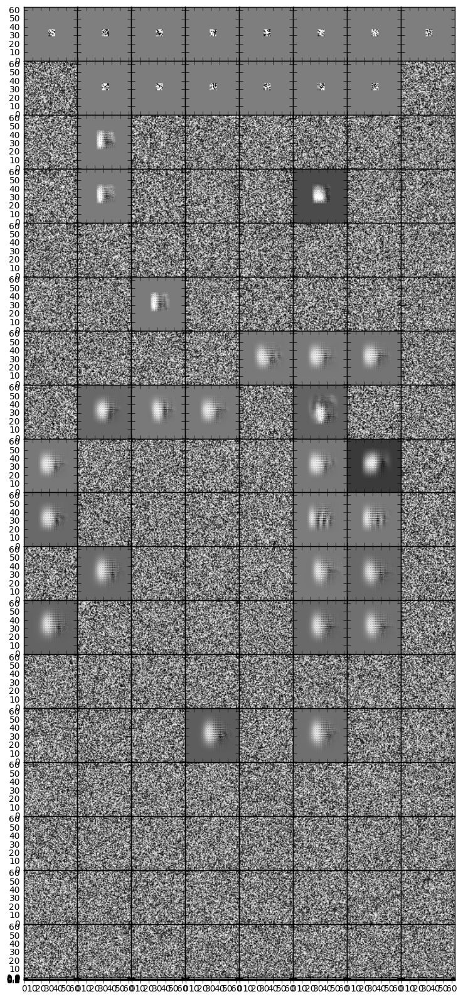

In [13]:
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111, nrows_ncols=(21, 8), axes_pad=0)
index = 0

for layer_index in range(5):
    for filter_index in range(model.layers[layer_index].nb_filter):
        img = draw_filter(layer_index, filter_index)
        grid[index].imshow(img, cmap='gray', origin='lower')
        index += 1

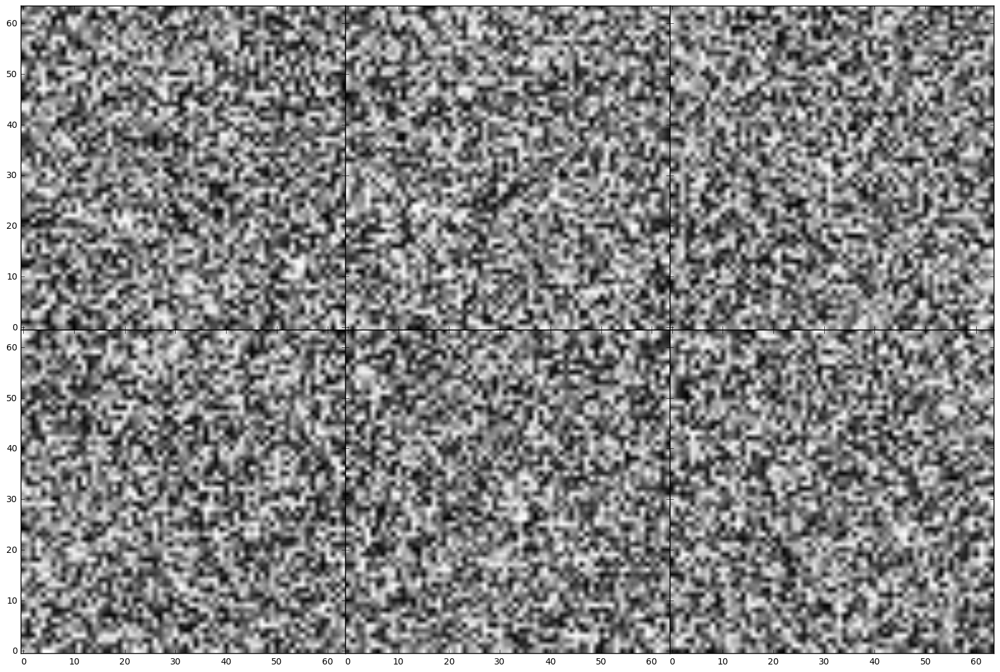

In [14]:
fig = plt.figure(1, (20., 20.))
grid = ImageGrid(fig, 111, nrows_ncols=(2, 3), axes_pad=0, direction='column')
index = 0

for out_index in range(3):
    img_min, img_max = draw_output(out_index)
    grid[index].imshow(img_min, cmap='gray', origin='lower')
    grid[index + 1].imshow(img_max, cmap='gray', origin='lower')
    index += 2